# Comparison of different MPI calibrations

In [1]:
import pandas
import os
import altair as alt
import zipfile
import io
import yaml

# Utility functions

These are used to build the dataframes from the archive content.

In [2]:

def extract_zip(zip_name):
    '''Taken from https://stackoverflow.com/a/10909016/4110059'''
    input_zip = zipfile.ZipFile(zip_name)
    result = {}
    deployment = 'deploy' in yaml.load(input_zip.read('info.yaml'))['command']
    experiment = zip_name[zip_name.index('/')+1:]
    experiment = experiment[:experiment.index('_')]
    for name in input_zip.namelist():
        if name.endswith('.csv'):
            dataframe = pandas.read_csv(io.BytesIO(input_zip.read(name)), names = ['op', 'msg_size', 'start', 'duration'])
            dataframe['experiment'] = experiment
            dataframe['type'] = name
            dataframe['deployment'] = deployment
            dataframe['index'] = range(len(dataframe))
            result[name] = dataframe
    return result


def extract_folder(folder_name):
    result = {}
    for root, dirs, files in os.walk(folder_name):
        for file in files:
            if file.endswith('.zip'):
                filename = os.path.join(root, file)
                result[filename] = extract_zip(filename)
    return result


def aggregate_dataframe(dataframe):
    df = dataframe.groupby('msg_size').mean().reset_index()
    df['experiment'] = dataframe['experiment'].unique()[0]
    return df


def lower_quantile(df):
    df = pandas.DataFrame(df)
    quantiles = df.groupby('msg_size').quantile(0.5).reset_index()
    df['above_quantile'] = True
    for size in quantiles.msg_size:
        duration_thresh = quantiles[quantiles.msg_size == size].duration.unique()[0]
        df.loc[(df.msg_size == size) & (df.duration < duration_thresh), 'above_quantile'] = False
    return df[~df.above_quantile]


def merge_dataframes(folder_dict, dataframe_name, dataframe_processing=lambda x: x):
    all_df = []
    for folder, dataframes in folder_dict.items():
        all_df.append(dataframe_processing(dataframes[dataframe_name]))
    return pandas.concat(all_df)

def get_file(zip_name, file_name):
    return zipfile.ZipFile(zip_name).read(file_name).decode('ascii')

In [3]:
dataframes = extract_folder('results_paravance_deploy')
all_experiments = list(dataframes.keys())
alldf = merge_dataframes(dataframes, 'exp/exp_Recv.csv')
print(len(alldf))
alldf.head(3)

331000


,op,msg_size,start,duration,experiment,type,deployment,index
0,MPI_Recv,765921,0.006425,0.000769,paravance-13-paravance-2,exp/exp_Recv.csv,False,0
1,MPI_Recv,765921,0.010019,0.000851,paravance-13-paravance-2,exp/exp_Recv.csv,False,1
2,MPI_Recv,765921,0.013711,0.000866,paravance-13-paravance-2,exp/exp_Recv.csv,False,2


In [4]:
# alt.data_transformers.enable('csv')
def do_plot(df, x, y, color, facet, log_y=True):
    def get_title(f_name):
        return '%s: %s' % (facet, f_name)
    df = pandas.DataFrame(df)
    df[facet] = df[facet].astype(str)
    ydomain = [min(df[y]), max(df[y])]
    brush = alt.selection_interval(encodings=['x'])
    scale = alt.Scale(type='log', domain=ydomain) if log_y else alt.Scale(domain=ydomain)

    chart = alt.Chart(df.sample(n=5000)).mark_point(opacity=0.5).encode(   # *IMPORTANT* note that we have sampled the dataframe, for better plot interactivity
        x=alt.X(x, scale=alt.Scale(type='log')),
        y=alt.Y(y, scale=scale),
        color=alt.condition(brush, color, alt.value('lightgray'))
    ).add_selection(
        brush
    )

    allfacets = list(df[facet].unique())
    final = chart.transform_filter(alt.datum[facet]==allfacets[0]).properties(title=get_title(allfacets[0]))
    for f in allfacets[1:]:
        final |= chart.transform_filter(alt.datum[facet]==f).properties(title=get_title(f))
    return final

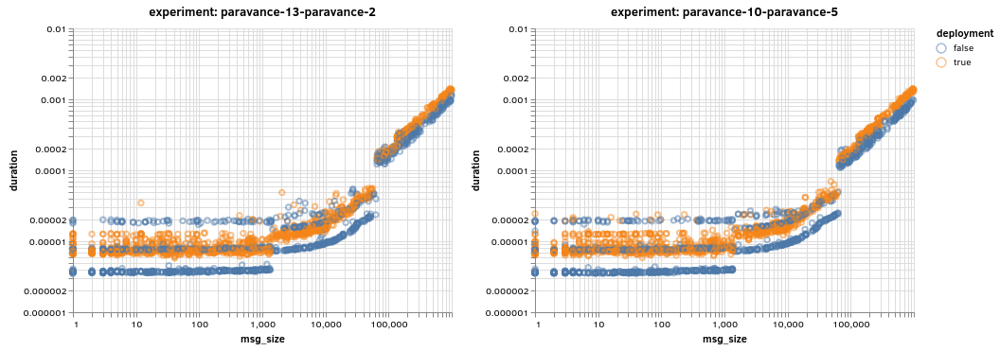

In [5]:
do_plot(alldf[alldf.experiment.isin(alldf.experiment.unique()[:2])], x='msg_size', y='duration', color='deployment', facet='experiment')

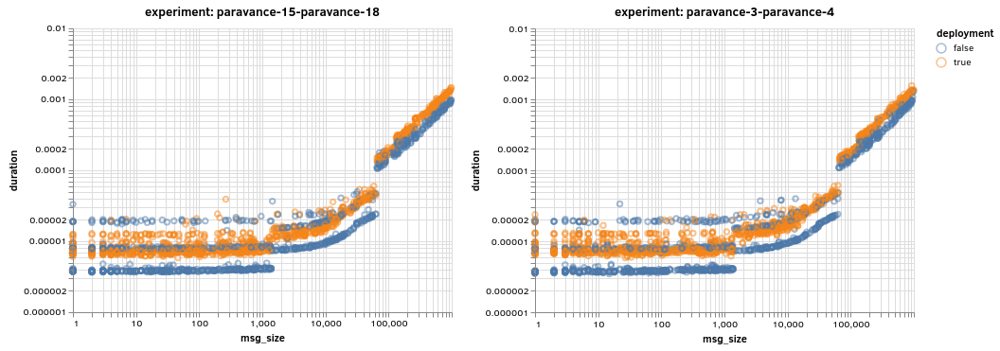

In [6]:
do_plot(alldf[alldf.experiment.isin(alldf.experiment.unique()[2:4])], x='msg_size', y='duration', color='deployment', facet='experiment')

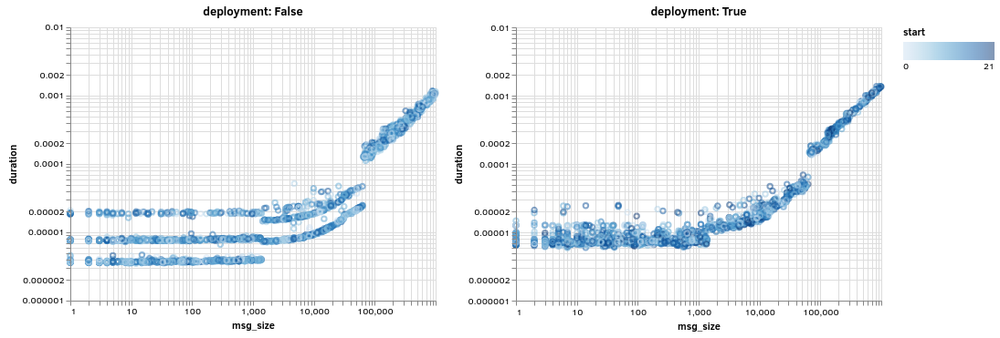

In [7]:
exp = alldf.experiment.unique()[0]
df = pandas.DataFrame(alldf[alldf.experiment == exp])
do_plot(df, x='msg_size', y='duration', color='start', facet='deployment')

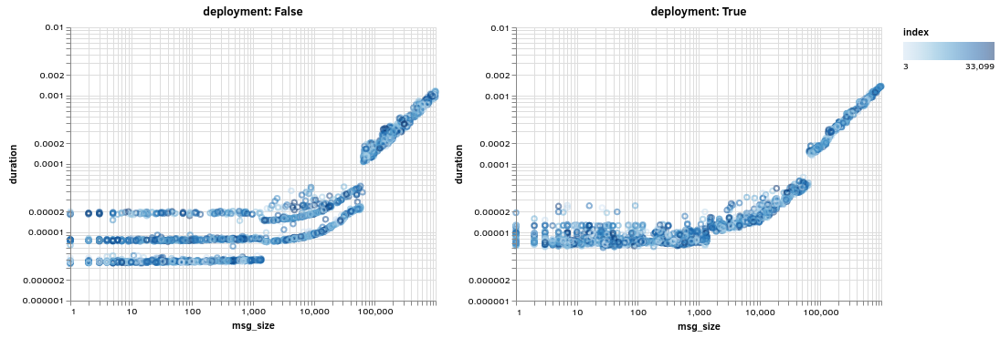

In [8]:
do_plot(df, x='msg_size', y='duration', color='index', facet='deployment')